<a href="https://colab.research.google.com/github/AshbeeKim/AshbeeKim-1/blob/main/Test_on_20210722.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 7.22 [딥러닝 응용기법]

dataset : https://s3.amazonaws.com/keras-datasets/jena_climate_2009_2016.csv.zip

1.	딥러닝 모델링을 적용하기 전에 데이터 처리를 하시오.
2.	평가지표를 정의한 다음 정의가 타당한지 서술하고 함수로 코드를 작성하시오.
3.	딥러닝을 Dense로만 쌓고, 결과를 해석하시오.
4.	딥러닝 모델에서 Dense층을 개선하여 모델을 작성하시오.
5.	양방향 순환신경망으로 모델을 작성하고 결과를 해석하시오.

In [ ]:
import os
from google.colab import drive  
from os.path import join

# 구글 드라이브 접근
ROOT = "/content/drive"
drive.mount(ROOT)

# 구글 프로젝트 공유 폴더 경로
CO_WORK = "MyDrive/Task"
CW_PATH = join(ROOT, CO_WORK)

DATAS = "climate"
DATA_PATH = join(CW_PATH, DATAS)
# !mkdir "{DATA_PATH}"
%cd "{DATA_PATH}"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/.shortcut-targets-by-id/1srYR8TqwFsUSR4BYzQtIBmWUKrEBjd44/Task/climate


In [ ]:
# !wget https://s3.amazonaws.com/keras-datasets/jena_climate_2009_2016.csv.zip
# !unzip jena_climate_2009_2016.csv.zip
# !rm jena_climate_2009_2016.csv.zip

In [ ]:
f = open(f'{DATA_PATH}/jena_climate_2009_2016.csv')
data = f.read()
f.close()

lines = data.split('\n')
header = lines[0].split(',')
lines = lines[1:]

print(header)
print(len(lines))

['"Date Time"', '"p (mbar)"', '"T (degC)"', '"Tpot (K)"', '"Tdew (degC)"', '"rh (%)"', '"VPmax (mbar)"', '"VPact (mbar)"', '"VPdef (mbar)"', '"sh (g/kg)"', '"H2OC (mmol/mol)"', '"rho (g/m**3)"', '"wv (m/s)"', '"max. wv (m/s)"', '"wd (deg)"']
420451


In [ ]:
header  # "wd (deg)"를 맞추는 것인데, 시간축이 들어가 있는 것으로 봐서는 시계열로 접근을 해야 하는 것인가?

['"Date Time"',
 '"p (mbar)"',
 '"T (degC)"',
 '"Tpot (K)"',
 '"Tdew (degC)"',
 '"rh (%)"',
 '"VPmax (mbar)"',
 '"VPact (mbar)"',
 '"VPdef (mbar)"',
 '"sh (g/kg)"',
 '"H2OC (mmol/mol)"',
 '"rho (g/m**3)"',
 '"wv (m/s)"',
 '"max. wv (m/s)"',
 '"wd (deg)"']

In [ ]:
lines # 회귀? 아니면 binning 후 분류?

['01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.30,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.30',
 '01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.40,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.10',
 '01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.90,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.60',
 '01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.20,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.00',
 '01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.10,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.30',
 '01.01.2009 01:00:00,996.50,-8.05,265.38,-8.78,94.40,3.33,3.14,0.19,1.96,3.15,1307.86,0.21,0.63,192.70',
 '01.01.2009 01:10:00,996.50,-7.62,265.81,-8.30,94.80,3.44,3.26,0.18,2.04,3.27,1305.68,0.18,0.63,166.50',
 '01.01.2009 01:20:00,996.50,-7.62,265.81,-8.36,94.40,3.44,3.25,0.19,2.03,3.26,1305.69,0.19,0.50,118.60',
 '01.01.2009 01:30:00,996.50,-7.91,265.52,-8.73,93.80,3.36,3.15,0.21,1.97,3.16,1307.17,0.28,0.75,188.50',
 '01.01.2009 01:40:00,996.53,-8.43,264.99,-9.3

In [ ]:
print(lines[0])
print(lines[144])
print(lines[-1])

01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.30,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.30
02.01.2009 00:10:00,999.55,-4.60,268.60,-5.52,93.20,4.34,4.04,0.29,2.52,4.04,1294.58,0.85,1.38,151.20
01.01.2017 00:00:00,999.82,-4.82,268.36,-8.42,75.70,4.27,3.23,1.04,2.01,3.23,1296.38,1.23,1.96,184.90


## Q1) 딥러닝 모델링을 적용하기 전에 데이터 처리를 하시오.

In [ ]:
col_chk = [chk.strip('"') for chk in header]

explanation = ["Date Time", "Pressure", "Temperature", "Temperature in Kelvin", "Temperature (dew point)",
              "Relative Humidity", "Saturation vapor pressure", "Vapor pressure", "Vapor pressure deficit", "Specific humidity",
              "Water vapor concentration", "Airtight", "Wind speed", "Maximum wind speed", "Wind direction in degrees"]
# columns info 참고 사이트 : https://keras.io/examples/timeseries/timeseries_weather_forecasting/

header_dict = {}

for h, ex in zip(col_chk, explanation):
  header_dict[h] = ex
print(header_dict.values()) # keras 사이트에서 참고한 각 열에 대한 정보

trans = ["일시", "기압", "기온(섭씨)", "기온(켈빈)", "이슬점 온도", "상대 습도", "포화증기압", "증기압", "수증기압차이", "비습도", "수증기 농도", "공기밀도", "풍속", "최대 풍속", "풍향(방위)"]
# 수증기압차이(Vapor Pressure Deficit)는 대기 중 수증기의 농도차를 의미합니다. '포차'(수증기압포차) 또는 대기건조력 이라고도 표현
# 비습도 혹은 비습(比濕度, 比濕, specific humidity)는 일정 질량의 공기에 대한 수증기 질량의 비율
header_dtrans = {}
for eng, kor in zip(header_dict.values(), trans):
  header_dtrans[eng] = kor
print(header_dtrans.values()) # 각 열의 한글 정보

# kelvin to celsius
# 0K − 273.15 = -273.1°C

dict_values(['Date Time', 'Pressure', 'Temperature', 'Temperature in Kelvin', 'Temperature (dew point)', 'Relative Humidity', 'Saturation vapor pressure', 'Vapor pressure', 'Vapor pressure deficit', 'Specific humidity', 'Water vapor concentration', 'Airtight', 'Wind speed', 'Maximum wind speed', 'Wind direction in degrees'])
dict_values(['일시', '기압', '기온(섭씨)', '기온(켈빈)', '이슬점 온도', '상대 습도', '포화증기압', '증기압', '수증기압차이', '비습도', '수증기 농도', '공기밀도', '풍속', '최대 풍속', '풍향(방위)'])


In [ ]:
for idx, (col, ex) in enumerate(header_dict.items()):
  print(idx, col, ex)

0 Date Time Date Time
1 p (mbar) Pressure
2 T (degC) Temperature
3 Tpot (K) Temperature in Kelvin
4 Tdew (degC) Temperature (dew point)
5 rh (%) Relative Humidity
6 VPmax (mbar) Saturation vapor pressure
7 VPact (mbar) Vapor pressure
8 VPdef (mbar) Vapor pressure deficit
9 sh (g/kg) Specific humidity
10 H2OC (mmol/mol) Water vapor concentration
11 rho (g/m**3) Airtight
12 wv (m/s) Wind speed
13 max. wv (m/s) Maximum wind speed
14 wd (deg) Wind direction in degrees


In [ ]:
VSL_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420451 entries, 0 to 420450
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   Date Time        420451 non-null  object
 1   p (mbar)         420451 non-null  object
 2   T (degC)         420451 non-null  object
 3   Tpot (K)         420451 non-null  object
 4   Tdew (degC)      420451 non-null  object
 5   rh (%)           420451 non-null  object
 6   VPmax (mbar)     420451 non-null  object
 7   VPact (mbar)     420451 non-null  object
 8   VPdef (mbar)     420451 non-null  object
 9   sh (g/kg)        420451 non-null  object
 10  H2OC (mmol/mol)  420451 non-null  object
 11  rho (g/m**3)     420451 non-null  object
 12  wv (m/s)         420451 non-null  object
 13  max. wv (m/s)    420451 non-null  object
 14  wd (deg)         420451 non-null  object
dtypes: object(15)
memory usage: 48.1+ MB


In [ ]:
VSL_data.iloc[1,[6]].values

array(['3.23'], dtype=object)

In [ ]:
[type(chk) for chk in VSL_data.iloc[1,[1]] if '.' in chk]

[str]

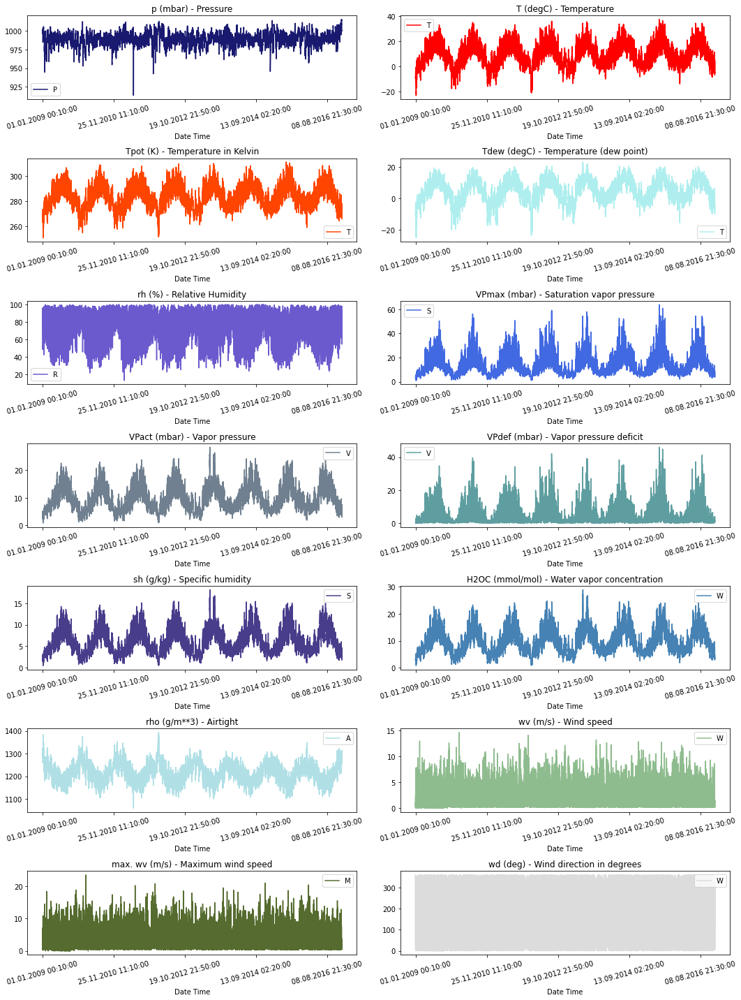

In [ ]:
import pandas as pd
# 시각화해서 확인하기 편하게 만듦
VSL_data = pd.DataFrame([cont.split(',') for cont in lines],
                        columns=col_chk)

for col in range(1, 15):
  VSL_data.iloc[:,[col]] = VSL_data.iloc[:,[col]].astype('float64') 

from matplotlib import pyplot as plt
# 각 데이터의 색을 다르게 지정
color_list = ["midnightblue", 
              "red",
              "orangered",
              "paleturquoise",
              "slateblue",
              "royalblue",
              "slategrey",
              "cadetblue",
              "darkslateblue",
              "steelblue",
              "powderblue",
              "darkseagreen",
              "darkolivegreen",
              "gainsboro"]

f, axs = plt.subplots(nrows=7, ncols=2, figsize=(15, 20))

for idx, (col, ex) in enumerate(header_dict.items()):
  if idx==0:
    pass
  else:
    c = color_list[(idx-1)%(len(color_list))]
    chk_data = VSL_data.loc[:,col]
    chk_data.index = VSL_data['Date Time']
    ax = chk_data.plot(ax=axs[(idx-1)//2, (idx-1)%2], color=c,
                       title=f"{col} - {ex}", rot=15)
    ax.legend(ex)
plt.tight_layout()
plt.show()

온도에 대한 주기성이 있다는 것을 잘 볼 수 있음

증기압, 비습도, 공기밀도 등에 대해서도 주기성을 확인할 수 있음

In [ ]:
# 공식 문서 사용 함수
# def show_heatmap(data):
#     plt.matshow(data.corr())
#     plt.xticks(range(data.shape[1]), data.columns, fontsize=14, rotation=90)
#     plt.gca().xaxis.tick_bottom()
#     plt.yticks(range(data.shape[1]), data.columns, fontsize=14)

#     cb = plt.colorbar()
#     cb.ax.tick_params(labelsize=14)
#     plt.title("Feature Correlation Heatmap", fontsize=14)
#     plt.show()
# show_heatmap(df)
import seaborn as sns
sns.heatmap(VSL_data.corr(), annot=True, square=True)
plt.show()

In [ ]:
import numpy as np

float_data = np.zeros((len(lines), len(header) - 1))  
# 마지막 wd (deg)가 target, -1로 총 15개의 열 중 target을 제외한 14개의 열만 저장?
# 넘파이로 바꾸는 이유 : 420451만개의 데이터==데이터가 많다는 뜻->속도감 있게 처리하기 위해서
for i, line in enumerate(lines):
    values = [float(x) for x in line.split(',')[1:]]
    float_data[i, :] = values
# 교안의 다음 코드를 참고하면, ......datetime을 없앤 것 같은데 굳이 처리하지 않아도 시간에 따라 들어오기 때문인가?
# 아니면 다른 방식으로 풀기 위해서 그런 것인가?
# target은 단순 한 개를 말하는 것이 아닌, 14개의 값 모두가 될 수 도 있을 것 같음

In [ ]:
float_data.shape

(420451, 14)

In [ ]:
float_data.ndim # 2차원

2

In [ ]:
float_data.dtype

dtype('float64')

In [ ]:
type(float_data)

numpy.ndarray

In [ ]:
# Preparing the data
mean = float_data[:200000].mean(axis=0)
float_data -= mean
std = float_data[:200000].std(axis=0)
float_data /= std
# 비슷한 정규 범위를 만듦

# 파이썬 제너레이터
# target이 똑같아서 생길 경우를 막기 위해


In [ ]:
def generator(data, lookback, delay, min_index, max_index, shuffle=False, batch_size=16, step=6):
    if max_index is None:
        max_index = len(data) - delay - 1
    i = min_index + lookback
    while 1:
        if shuffle:
            rows = np.random.randint(
                min_index + lookback, max_index, size=batch_size)
        else:
            if i + batch_size >= max_index:
                i = min_index + lookback
            rows = np.arange(i, min(i + batch_size, max_index))
            i += len(rows)

        samples = np.zeros((len(rows),
                           lookback // step,
                           data.shape[-1]))
        targets = np.zeros((len(rows),))
        for j, row in enumerate(rows):
            indices = range(rows[j] - lookback, rows[j], step)
            samples[j] = data[indices]
            targets[j] = data[rows[j] + delay][1]
        yield samples, targets

In [ ]:
lookback = 1440
step = 6
delay = 144
batch_size = 128

train_gen = generator(float_data,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=200000,
                      shuffle=True,
                      step=step, 
                      batch_size=batch_size)
val_gen = generator(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=200001,
                    max_index=300000,
                    step=step,
                    batch_size=batch_size)
test_gen = generator(float_data,
                     lookback=lookback,
                     delay=delay,
                     min_index=300001,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

# 전체 검증 세트를 순회하기 위해 val_gen에서 추출할 횟수
val_steps = (300000 - 200001 - lookback) // batch_size

# 전체 테스트 세트를 순회하기 위해 test_gen에서 추출할 횟수
test_steps = (len(float_data) - 300001 - lookback) // batch_size

## Q2) 평가지표를 정의한 다음 정의가 타당한지 서술하고 함수로 코드를 작성하시오.

MAPE or SMAPE??

In [ ]:
np.mean(np.abs(preds-targets))  # 음수가 나올 수도 있기 때문에 절대값으로 바꿈

loss = mean(abs(y_true - y_pred), axis=-1)

tf.keras.metrics.mean_absolute_error에서는 true값을 predict한 값으로 뺀 것을 절대값으로 변한 뒤, 평균을 구하는 식이었음

[mae 공식문서] https://www.tensorflow.org/api_docs/python/tf/keras/metrics/mean_absolute_error?hl=ko

이게 조삼모사와 같은 내용인가??를 고민하다가 간단한 연산으로 확인해보기로 함

In [ ]:
import numpy as np

tg = [3, 4, 8, 6]
pd = [2, 5, 7, 6]

a = []
b = []

for t, p in zip(tg, pd):
  a.append(np.abs(t-p))
  b.append(np.abs(p-t))
print(np.mean(a))
print(np.mean(b))

0.75
0.75


같은 동일함 -> 결국 같은 내용이란 말

따라서 교안의 함수를 사용해도 되고, tensorflow내의 mae함수를 사용해도 됨

In [ ]:
def evaluate_naive_method():
    batch_maes = []
    for step in range(val_steps):
        samples, targets = next(val_gen)
        preds = samples[:, -1, 1]
        mae = np.mean(np.abs(preds - targets))
        batch_maes.append(mae)
    print(np.mean(batch_maes))
    
evaluate_naive_method()

0.2897359729905486


## Q3) 딥러닝을 Dense로만 쌓고, 결과를 해석하시오.

In [ ]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.Flatten(input_shape=(lookback // step, float_data.shape[-1])))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=20,
                              validation_data=val_gen,
                              validation_steps=val_steps)

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1915: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
500/500 [==============================] - 31s 33ms/step - loss: 2.0179 - val_loss: 0.6545
Epoch 2/20
500/500 [==============================] - 16s 32ms/step - loss: 0.4961 - val_loss: 0.3705
Epoch 3/20
500/500 [==============================] - 16s 32ms/step - loss: 0.3033 - val_loss: 0.3044
Epoch 4/20
500/500 [==============================] - 16s 32ms/step - loss: 0.2688 - val_loss: 0.3902
Epoch 5/20
500/500 [==============================] - 16s 32ms/step - loss: 0.2549 - val_loss: 0.3110
Epoch 6/20
500/500 [==============================] - 16s 33ms/step - loss: 0.2430 - val_loss: 0.3400
Epoch 7/20
500/500 [==============================] - 16s 32ms/step - loss: 0.2371 - val_loss: 0.3050
Epoch 8/20
500/500 [==============================] - 16s 32ms/step - loss: 0.2319 - val_loss: 0.3282
Epoch 9/20
500/500 [==============================] - 16s 32ms/step - loss: 0.2290 - val_loss: 0.3104
Epoch 10/20
500/500 [==============================] - 16s 32ms/step - loss: 0.221

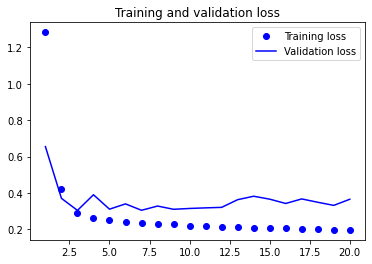

In [ ]:
import matplotlib.pyplot as plt

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

첫번째 epoch에서 두번째 epoch으로 넘어갈 때, loss값이 훅 떨어짐

train과 validation의 loss의 폭이 좁혀지는지 확인하기 어려웠음

## Q4) 딥러닝 모델에서 Dense층을 개선하여 모델을 작성하시오.

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1915: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/50
500/500 [==============================] - 24s 21ms/step - loss: 0.3761 - val_loss: 0.3491
Epoch 2/50
500/500 [==============================] - 10s 20ms/step - loss: 0.2651 - val_loss: 0.3278
Epoch 3/50
500/500 [==============================] - 10s 20ms/step - loss: 0.2240 - val_loss: 0.3267
Epoch 4/50
500/500 [==============================] - 10s 20ms/step - loss: 0.1970 - val_loss: 0.3407
Epoch 5/50
500/500 [==============================] - 11s 21ms/step - loss: 0.1756 - val_loss: 0.3458
Epoch 6/50
500/500 [==============================] - 11s 21ms/step - loss: 0.1611 - val_loss: 0.3432
Epoch 7/50
500/500 [==============================] - 10s 21ms/step - loss: 0.1501 - val_loss: 0.3371
Epoch 8/50
500/500 [==============================] - 10s 20ms/step - loss: 0.1416 - val_loss: 0.3387
Epoch 9/50
500/500 [==============================] - 10s 20ms/step - loss: 0.1324 - val_loss: 0.3540
Epoch 10/50
500/500 [==============================] - 10s 20ms/step - loss: 0.128

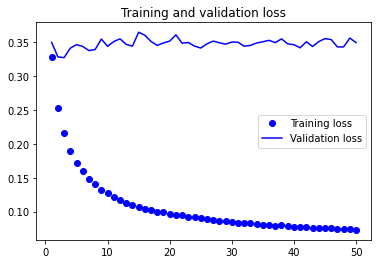

In [ ]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

model = Sequential()
model.add(layers.Flatten(input_shape=(lookback // step, float_data.shape[-1])))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(8, activation='tanh'))
model.add(layers.Dense(1))

model.compile(optimizer=RMSprop(), loss='mae')
history = model.fit_generator(train_gen,
                              steps_per_epoch=500,
                              epochs=50,
                              validation_data=val_gen,
                              validation_steps=val_steps)

import matplotlib.pyplot as plt

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

epoch 1부터 loss가 많이 잡혔다는 것을 볼 수 있음

epoch 7 이후부터는 적당하게 오가던 val_loss의 수치가 다시 증가했고, 0.34x~0.36x을 반복하고 있음

그래도 epoch 21이 지나고선 val_loss의 수치폭이 0.34x~0.35x의 범주에 있지만, 엄청 예쁜 그래프가 그려졌다는 생각은 들지 않음

loss가 0.1x이하로 떨어진 것에 다행이라고 생각을 하지만, 잡힐 듯 잡히지 않는 val_loss를 보며, 깊게 쌓은 Dense가 문제인 것인지 아니면 output직전의 activation을 tanh으로 한 게 문제인 것인지를 고민했음

잘 학습된 모델을 보면, train과 validation의 loss 간격이 줄어드는 양상을 보이던데, output에 tanh을 먹였어야 했는지 아직까지도 물음표가 해소되지 않았음

tanh을 사용하려면 [-1,1]의 범위에 들어가야 한다고 하던데, 의식의 흐름대로 작성한 부분이라 과연 제대로 작성했는지에 대한 의문은 듦(수학적 사고력의 부족함을 느끼던 순간)

RNN을 조금 더 이해하게 되면 시도해 볼 내용

-----

이전 keras.layers.CuDNNLSTM/CuDNNGRU 레이어는 더 이상 사용되지 않으며 실행 기반이 되는 하드웨어를 신경 쓰지 않고 모델을 빌드할 수 있습니다.

CuDNN 커널은 특정한 가정 하에 구축되므로 다음과 같이 내장 LSTM 또는 GRU 레이어의 기본값을 변경하면 레이어가 CuDNN 커널을 사용할 수 없게 됩니다.

* activation 함수를 tanh에서 다른 값으로 변경
* recurrent_activation 함수를 sigmoid에서 다른 값으로 변경
* 0보다 큰 recurrent_dropout 사용
* unroll을 True로 설정(이 경우, LSTM/GRU가 내부 tf.while_loop를 언롤된 for 루프로 분해함)
* use_bias를 False로 설정
입력 데이터가 정확히 오른쪽 패딩 처리되지 경우에 마스킹 사용(마스크가 정확히 오른쪽 패딩 처리된 데이터에 해당하는 경우에는 CuDNN을 사용할 수 있으며, 이것이 가장 일반적인 경우임)


## Q5) 양방향 순환신경망으로 모델을 작성하고 결과를 해석하시오.

# 7.22 [딥러닝 고급분석기법 활용]
1. Neural Transfer를 이용하여 임의의 사진에 적용을 해보시오.(tf-hub를 이용하시오)
2. Neural Transfer의 Gradient Tape을 함수로 작성하시오.
3. ~~ General Adversial Network를 수행해보시오.~~
4. ~~Speech Commands 데이터 세트로 분석을 진행하시오.~~
5. ~~Speech Commands 데이터 세트에서 전이학습을 적용하여 분석을 진행하시오. ~~


3. General Adversial Network의 생성자와 감별자의 네트워크를 구성해보시오.
4. General Adversial Network의 Gradient Tape를 작성해보시오.
5. General Adversial Network를 MNIST에 대해서 해보고, 학습하는 코드 및 결과를 제출하고 해석하시오.

In [ ]:
!nvidia-smi

Wed Jul 21 15:38:22 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    35W / 250W |   1615MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)
  
# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images (batch x height x width x channel). Sum of ten runs.
CPU (s):
1.5913341330000037
GPU (s):
0.033364341999998715
GPU speedup over CPU: 47x


In [ ]:
# !pip install --upgrade pip
# !pip install --upgrade tensorflow
# !pip install --upgrade tensorflow_hub
# !pip install tf-nightly
# !pip install torch

In [ ]:
"# !docker pull tensorflow/tensorflow:latest  # Download latest stable image
# !docker run -it -p 8888:8888 tensorflow/tensorflow:latest-jupyter  # Start Jupyter server

In [ ]:
# import torch
# print("Torch version:{}".format(torch.__version__))
# print("cuda version: {}".format(torch.version.cuda))
# print("cudnn version:{}".format(torch.backends.cudnn.version()))

Torch version:1.9.0+cu102
cuda version: 10.2
cudnn version:7605


In [ ]:
import os
import numpy as np
import PIL.Image
import time
import functools

import IPython.display as display
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import gridspec
mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
print("TF Version: ", tf.__version__)
print("TF-Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.test.is_gpu_available())

TF Version:  2.5.0
TF-Hub version:  0.12.0
Eager mode enabled:  True
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU available:  True


## Q1) Neural Transfer를 이용하여 임의의 사진에 적용을 해보시오.(tf-hub를 이용하시오)

In [ ]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

# tensor로 연산해야 반환이 쉽고, x*y*z 모양 행렬이라 tensor 사용

In [ ]:
content_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')

# https://commons.wikimedia.org/wiki/File:Vassily_Kandinsky,_1913_-_Composition_7.jpg
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

196608/195196 [==============================] - 0s 0us/step


In [ ]:
content_path

'/root/.keras/datasets/YellowLabradorLooking_new.jpg'

In [ ]:
style_path

'/root/.keras/datasets/kandinsky5.jpg'

In [ ]:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [ ]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

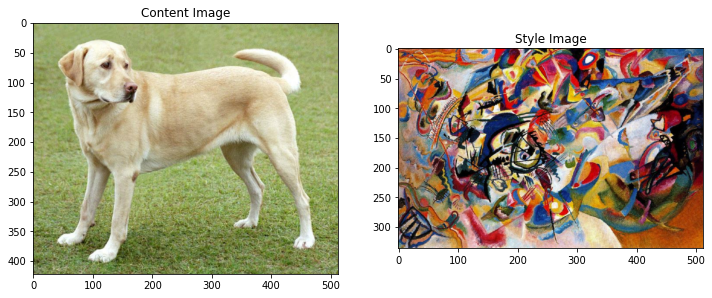

In [ ]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

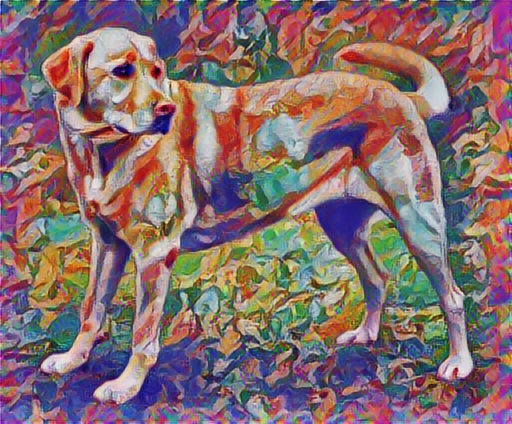

In [ ]:
hub_module = hub.load("https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1")
stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [ ]:
from google.colab import drive
from google.colab import files
files.upload()

Saving a.jpg.crdownload to a.jpg.crdownload
Saving b.jpeg.crdownload to b.jpeg.crdownload
Saving c.jpg to c.jpg
Saving d.jpeg.crdownload to d.jpeg.crdownload
Saving e.jpeg to e.jpeg
Saving f.jpg.crdownload to f.jpg.crdownload


{'a.jpg.crdownload': b'\xff\xd8\xff\xe1 \xf8Exif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x0c\x01\x00\x00\x03\x00\x00\x00\x01\x01\xab\x00\x00\x01\x01\x00\x03\x00\x00\x00\x01\x021\x00\x00\x01\x02\x00\x03\x00\x00\x00\x03\x00\x00\x00\x9e\x01\x06\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x01\x15\x00\x03\x00\x00\x00\x01\x00\x03\x00\x00\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00\xa4\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00\xac\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x011\x00\x02\x00\x00\x00\x1c\x00\x00\x00\xb4\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00\xd0\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\xe4\x00\x00\x01\x1c\x00\x08\x00\x08\x00\x08\x00\x94\xed\x00\x00\x00\'\x10\x00\x94\xed\x00\x00\x00\'\x10Adobe Photoshop CS5 Windows\x002016:03:11 21:32:11\x00\x00\x04\x90\x00\x00\x07\x00\x00\x00\x040221\xa0\x01\x00\x03\x00\x00\x00\x01\xff\xff\x00\x00\xa0\x02\x00\x04\x00\x00\x00\x01\x00\x00\x01\x8f\xa0\x03\x00\x04\x00\x00\x00\x01\x00\x00\x02\x0c\x00\x00\x

In [ ]:
edvardmunch_style = tf.keras.utils.get_file(fname='EdvardMunch.jpg', origin='https://www.google.com/url?sa=i&url=http%3A%2F%2Fm.blog.naver.com%2Fmeaingsoon%2F220752644281&psig=AOvVaw34K42iRr2k1HOwMkgPDka_&ust=1626969256217000&source=images&cd=vfe&ved=0CAsQjRxqFwoTCIi06qHD9PECFQAAAAAdAAAAABAD')
vangoh_style = tf.keras.utils.get_file(fname='VanGoh.jpg', origin='https://www.google.com/url?sa=i&url=http%3A%2F%2Fwww.theartist.co.kr%2Fnews%2FarticleView.html%3Fidxno%3D1548&psig=AOvVaw0zbOafkns7NeqdjZABMtUo&ust=1626969070730000&source=images&cd=vfe&ved=0CAsQjRxqFwoTCIjfwZ_C9PECFQAAAAAdAAAAABAD')
heartattack_cont1 = tf.keras.utils.get_file(fname='Heart1.jpg', origin='https://www.google.com/url?sa=i&url=https%3A%2F%2Fm.health.chosun.com%2Fsvc%2Fnews_view.html%3Fcontid%3D2017022001224&psig=AOvVaw0ovI6SI40yKA6uYttvuvdR&ust=1626969464605000&source=images&cd=vfe&ved=0CAsQjRxqFwoTCIjP_evD9PECFQAAAAAdAAAAABAo')
heartattack_cont2 = tf.keras.utils.get_file(fname='Heart2.jpg', origin='https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.jjalbot.com%2Fjjals%2FM8ktd30RVR&psig=AOvVaw0ovI6SI40yKA6uYttvuvdR&ust=1626969464605000&source=images&cd=vfe&ved=0CAsQjRxqFwoTCIjP_evD9PECFQAAAAAdAAAAABAy')

   8192/Unknown - 0s 0us/step

In [ ]:
print(edvardmunch_style)
edvardmunch_style = '/content/a.jpg'

/root/.keras/datasets/EdvardMunch.jpg


In [ ]:
print(vangoh_style)
vangoh_style = '/content/b.jpeg'

/root/.keras/datasets/VanGoh.jpg


In [ ]:
print(heartattack_cont1)
heartattack_cont1 = '/content/c.jpg'

/root/.keras/datasets/Heart1.jpg


In [ ]:
print(heartattack_cont2)
heartattack_cont2 = '/content/e.jpeg'

/root/.keras/datasets/Heart2.jpg


In [ ]:
heartattack_cont3 = '/content/f.jpg'

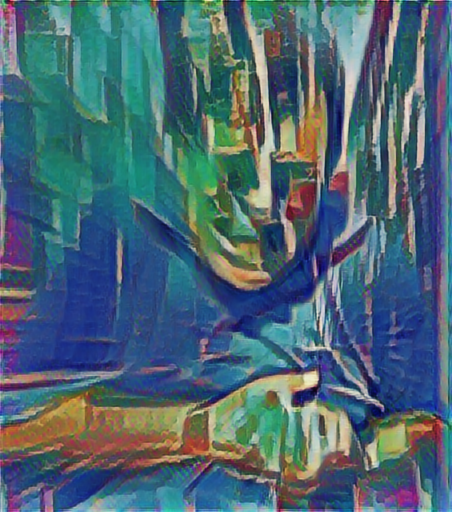

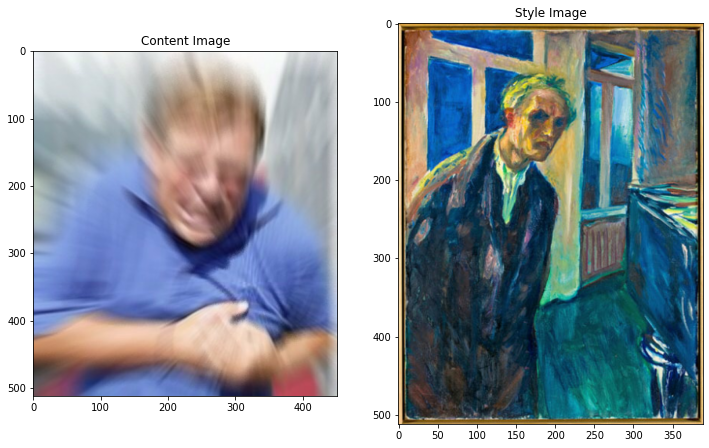

In [ ]:
content_image = load_img(heartattack_cont1)
style_image = load_img(edvardmunch_style)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

hub_module = hub.load("https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1")
stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

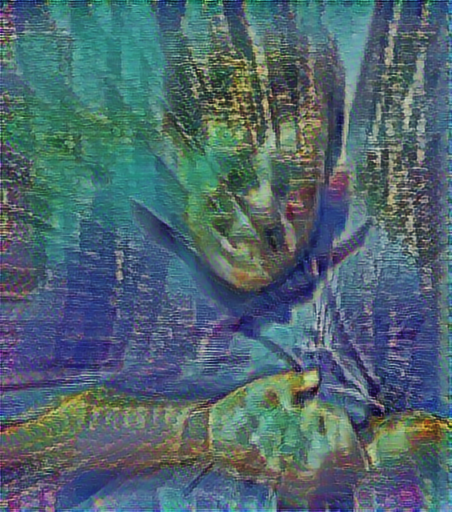

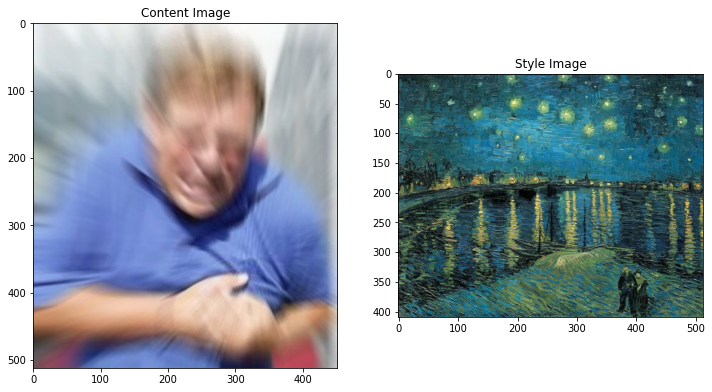

In [ ]:
content_image = load_img(heartattack_cont1)
style_image = load_img(vangoh_style)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

hub_module = hub.load("https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1")
stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

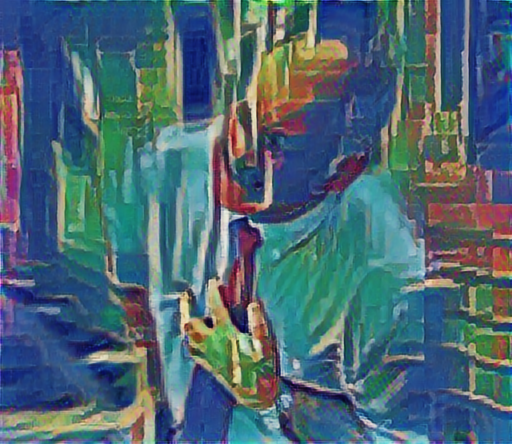

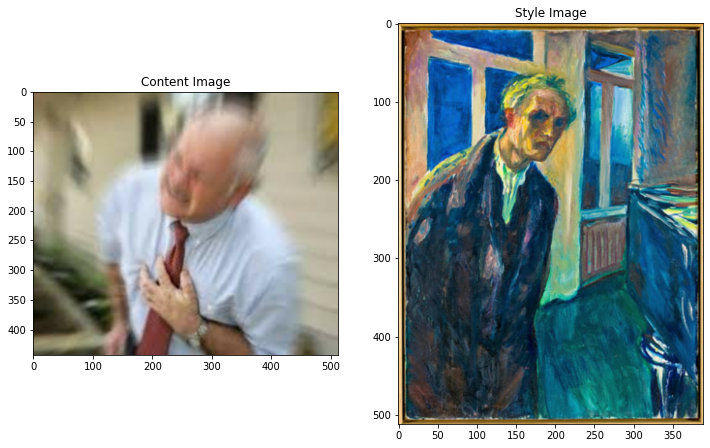

In [ ]:
content_image = load_img(heartattack_cont2)
style_image = load_img(edvardmunch_style)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

hub_module = hub.load("https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1")
stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

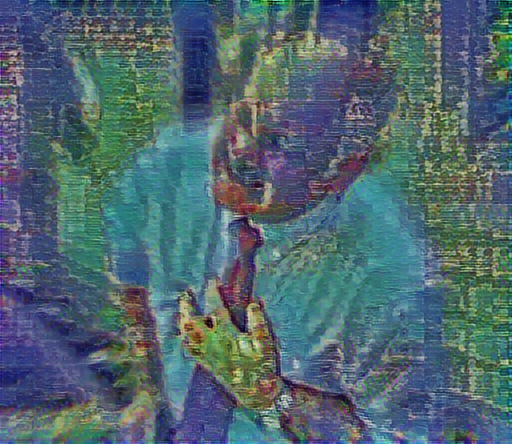

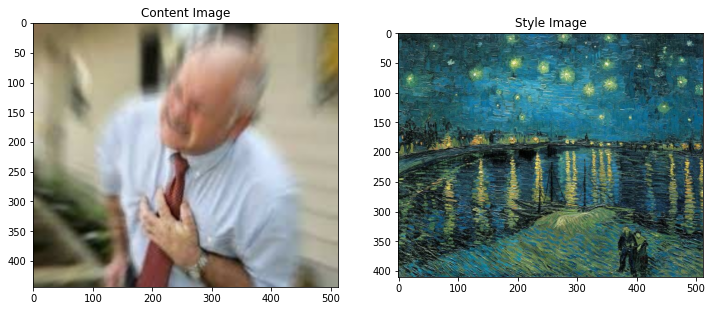

In [ ]:
content_image = load_img(heartattack_cont2)
style_image = load_img(vangoh_style)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

hub_module = hub.load("https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1")
stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

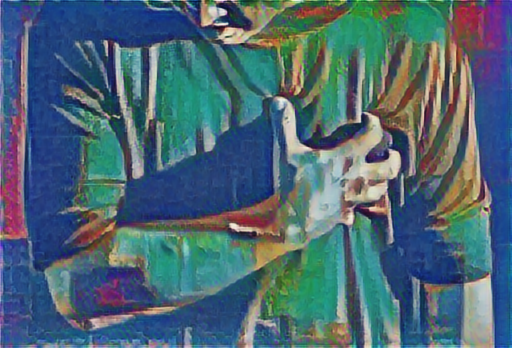

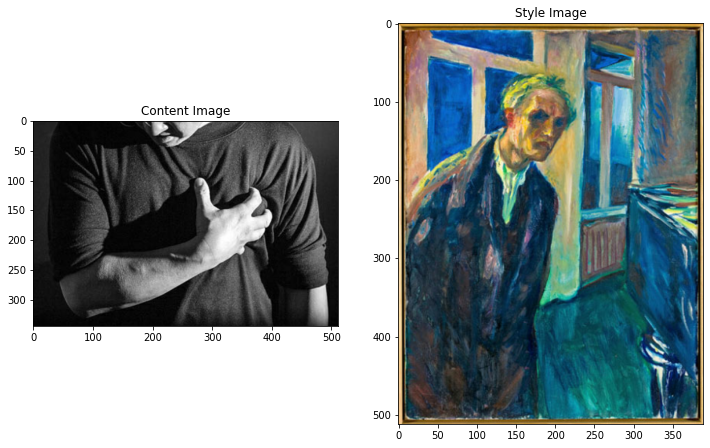

In [ ]:
content_image = load_img(heartattack_cont3)
style_image = load_img(edvardmunch_style)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

hub_module = hub.load("https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1")
stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

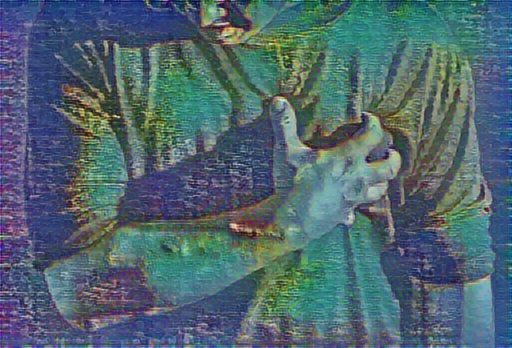

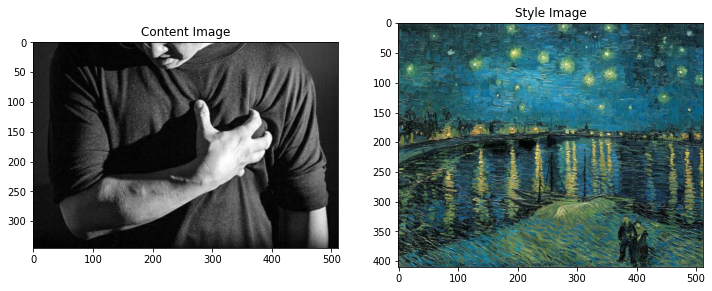

In [ ]:
content_image = load_img(heartattack_cont3)
style_image = load_img(vangoh_style)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

hub_module = hub.load("https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1")
stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

텐서플로우 자체 예제만 적용 가능한 것이 아니라, 일반적인 인상주의 화풍과 사진에도 적용이 가능했음.

이상했던 점? 적용에 어려움이 있었던 부분?은 

tf.keras.utils.get_file(f_name='imgname.jpg', origin='imgurl')으로 부른 내용은 확장자명을 제대로 인식하지 못했음

그래서 그냥 files.upload로 업로드한 파일의 경로를 사용해서 Neural Transfer를 이용함

942080/935806 [==============================] - 0s 0us/step


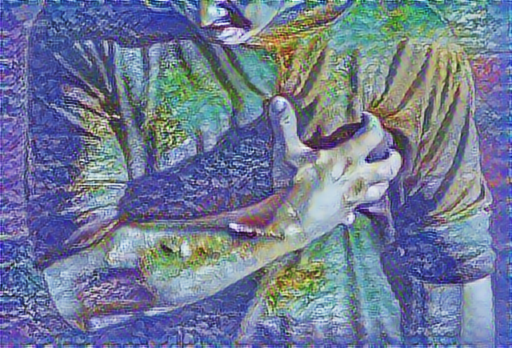

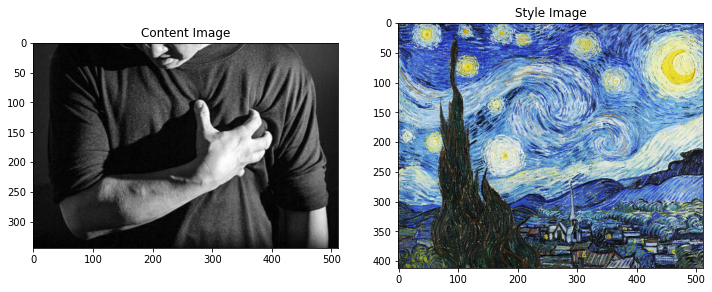

In [ ]:
style_image = tf.keras.utils.get_file(fname = "bilbao.jpg", origin = "https://i.imgur.com/9ooB60I.jpg")
content_image = load_img(heartattack_cont3)
style_image = load_img(style_image)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

hub_module = hub.load("https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1")
stylized_image = hub_module(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

## Q2) Neural Transfer의 Gradient Tape을 함수로 작성하시오.

In [ ]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)

print(prediction_probabilities.shape)

predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
print([(class_name, prob) for (number, class_name, prob) in predicted_top_5])

vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)

content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

574717952/574710816 [==============================] - 3s 0us/step
(1, 1000)
40960/35363 [==================================] - 0s 0us/step
[('abaya', 0.23997614), ('sweatshirt', 0.13291295), ('cloak', 0.110372335), ('academic_gown', 0.059572), ('mortarboard', 0.03594097)]
80142336/80134624 [==============================] - 1s 0us/step

input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [ ]:
def vgg_layers(layer_names):
  """ 중간층의 출력값을 배열로 반환하는 vgg 모델을 만듭니다."""
  # 이미지넷 데이터셋에 사전학습된 VGG 모델을 불러옵니다
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

# 각 층의 출력에 대한 통계량을 살펴봅니다
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  크기: ", output.numpy().shape)
  print("  최솟값: ", output.numpy().min())
  print("  최댓값: ", output.numpy().max())
  print("  평균: ", output.numpy().mean())
  print()

block1_conv1
  크기:  (1, 412, 512, 64)
  최솟값:  0.0
  최댓값:  796.0274
  평균:  32.39361

block2_conv1
  크기:  (1, 206, 256, 128)
  최솟값:  0.0
  최댓값:  3807.6765
  평균:  200.55374

block3_conv1
  크기:  (1, 103, 128, 256)
  최솟값:  0.0
  최댓값:  8727.893
  평균:  193.6475

block4_conv1
  크기:  (1, 51, 64, 512)
  최솟값:  0.0
  최댓값:  17986.469
  평균:  745.58185

block5_conv1
  크기:  (1, 25, 32, 512)
  최솟값:  0.0
  최댓값:  4104.9336
  평균:  60.980324



In [ ]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

class StyleContentModel(tf.keras.models.Model): # 일반적인 딥러닝 방법
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__() # 초기화자 받음
    self.vgg =  vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False  # 이미지넷에서 받았기 때문에 학습 안 함

  def call(self, inputs):
    "[0,1] 사이의 실수 값을 입력으로 받습니다"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name:value 
                    for content_name, value 
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name:value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content':content_dict, 'style':style_dict}

In [ ]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('스타일:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    크기: ", output.numpy().shape)
  print("    최솟값: ", output.numpy().min())
  print("    최댓값: ", output.numpy().max())
  print("    평균: ", output.numpy().mean())
  print()

print("콘텐츠:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    크기: ", output.numpy().shape)
  print("    최솟값: ", output.numpy().min())
  print("    최댓값: ", output.numpy().max())
  print("    평균: ", output.numpy().mean())

스타일:
   block1_conv1
    크기:  (1, 64, 64)
    최솟값:  0.0055228444
    최댓값:  28014.557
    평균:  263.79025

   block2_conv1
    크기:  (1, 128, 128)
    최솟값:  0.0
    최댓값:  61479.473
    평균:  9100.949

   block3_conv1
    크기:  (1, 256, 256)
    최솟값:  0.0
    최댓값:  545623.44
    평균:  7660.976

   block4_conv1
    크기:  (1, 512, 512)
    최솟값:  0.0
    최댓값:  4320501.5
    평균:  134288.84

   block5_conv1
    크기:  (1, 512, 512)
    최솟값:  0.0
    최댓값:  110005.37
    평균:  1487.0378

콘텐츠:
   block5_conv2
    크기:  (1, 26, 32, 512)
    최솟값:  0.0
    최댓값:  2410.8796
    평균:  13.764149


In [ ]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('스타일:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    크기: ", output.numpy().shape)
  print("    최솟값: ", output.numpy().min())
  print("    최댓값: ", output.numpy().max())
  print("    평균: ", output.numpy().mean())
  print()

print("콘텐츠:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    크기: ", output.numpy().shape)
  print("    최솟값: ", output.numpy().min())
  print("    최댓값: ", output.numpy().max())
  print("    평균: ", output.numpy().mean())

스타일:
   block1_conv1
    크기:  (1, 64, 64)
    최솟값:  0.0
    최댓값:  38215.36
    평균:  453.58582

   block2_conv1
    크기:  (1, 128, 128)
    최솟값:  0.0
    최댓값:  68622.53
    평균:  13558.804

   block3_conv1
    크기:  (1, 256, 256)
    최솟값:  0.0
    최댓값:  204858.45
    평균:  11569.244

   block4_conv1
    크기:  (1, 512, 512)
    최솟값:  0.0
    최댓값:  3084339.5
    평균:  196711.6

   block5_conv1
    크기:  (1, 512, 512)
    최솟값:  0.0
    최댓값:  109208.69
    평균:  1231.8422

콘텐츠:
   block5_conv2
    크기:  (1, 21, 31, 512)
    최솟값:  0.0
    최댓값:  812.91113
    평균:  12.56679


왔다갔다거리는 값을 최적화하기 위해 경사하강법 사용

In [ ]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

image = tf.Variable(content_image)

def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)
# 0과 1사이로 클리핑

opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
# 참조 연구에서는 LBFGS(이차미분사용)를 추천하지만, Adam도 충분히 적합.
style_weight=1e-2
content_weight=1e4


def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [ ]:
@tf.function()
# gpu로 구동
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

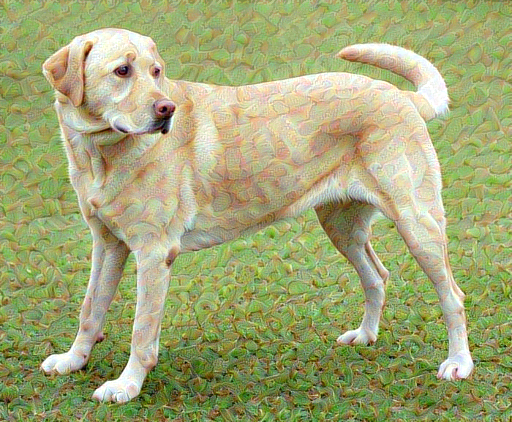

In [ ]:
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

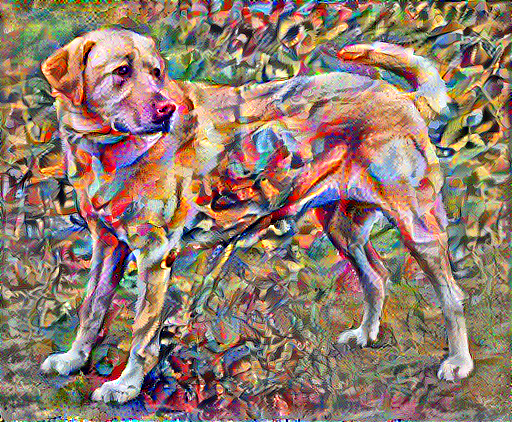

훈련 스텝: 1000
전체 소요 시간: 35.2


In [ ]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("훈련 스텝: {}".format(step))

end = time.time()
print("전체 소요 시간: {:.1f}".format(end-start))

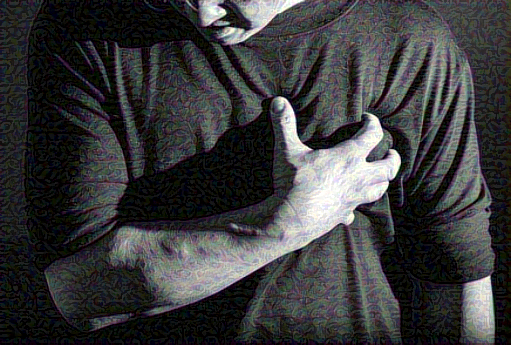

In [ ]:
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

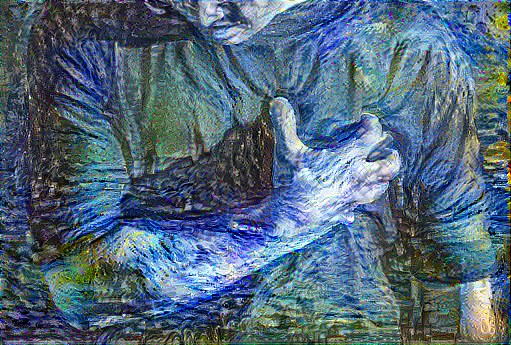

훈련 스텝: 1000
전체 소요 시간: 30.5


In [ ]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='')
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("훈련 스텝: {}".format(step))

end = time.time()
print("전체 소요 시간: {:.1f}".format(end-start))

gradient tape에 대해 이해한 바로는, 유화를 그릴 때 덧칠을 하는 과정에 따라 그림의 완성도가 달라지는 것과 비슷하다고 이해함

단순 흑백 사진의 심장질환자의 사진을 '별이빛나는밤'의 화풍을 활용해서, 심장어택 심하게 받은 듯한 심각한 상황을 연출할 수 있음

화풍이나 사진의 분위기로 심각한 상황이 아닌 짤(혹은 밈)화 할 수 있는 것은 덧칠만큼 중요한 게 스케치이기 때문이라고 생각함

## Q3) General Adversial Network의 생성자와 감별자의 네트워크를 구성해보시오.

In [ ]:
def make_generator_model(): # 논문에서 7*7*~식으로 들어가서 입력을 그렇게 한 것임
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256) # 주목: 배치사이즈로 None이 주어집니다.

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 28, 28, 1)
    return model

def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    return model

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

교안을 따라서 작성했으나, 데이터에 따라서 shape은 다르게 작성되어야 함을 프로젝트를 진행하며 확인함.


DCGAN에서는 generator를 마지막 아웃풋(activation='tanh')을 제외하곤 activation을 ReLU로 사용하라고 하는 내용이나,generator와 discriminator 모두 batchnorm을 하라는 내용을 봤지만, 아직까지는 tensor나 논문에 대한 이해도 낮아서 더 고민을 해봐야겠다는 판단을 내렸음.



## Q4) General Adversial Network의 Gradient Tape를 작성해보시오.

In [ ]:
# # 2번의 gradient tape 참고
# @tf.function()
# # gpu로 구동
# def train_step(image):
#   with tf.GradientTape() as tape:
#     outputs = extractor(image)
#     loss = style_content_loss(outputs)

#   grad = tape.gradient(loss, image)
#   opt.apply_gradients([(grad, image)])
#   image.assign(clip_0_1(image))

In [ ]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

2번의 gradienttape과 4번의 gradienttape은 분명한 차이가 존재함

@tf.function의 ()여부부터 드러난 차이는 공식 문서의 내용을 확인하게 되는 주요키가 되었음

[연산 속도 향상? @tf.function] https://www.tensorflow.org/guide/function?hl=ko

해당 내용에 따르면, ()안에 input_signature를 설정하기에 따라서도 달라진다고 하니, 정확한 활용을 위해서는 작성한 함수의 연산에 대한 이해도 필요하다고 느낌

결론) 아직 한참 멀음....ㅜ

In [ ]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # GIF를 위한 이미지를 바로 생성합니다.
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    # 15 에포크가 지날 때마다 모델을 저장합니다.
    if (epoch + 1) % 15 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    # print (' 에포크 {} 에서 걸린 시간은 {} 초 입니다'.format(epoch +1, time.time()-start))
    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  # 마지막 에포크가 끝난 후 생성합니다.
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)
  
def generate_and_save_images(model, epoch, test_input):
  # `training`이 False로 맞춰진 것을 주목하세요.
  # 이렇게 하면 (배치정규화를 포함하여) 모든 층들이 추론 모드로 실행됩니다. 
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4,4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

# 에포크 숫자를 사용하여 하나의 이미지를 보여줍니다.
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

## Q5) General Adversial Network를 MNIST에 대해서 해보고, 학습하는 코드 및 결과를 제출하고 해석하시오.

In [ ]:
# GIF를 만들기위해 설치합니다.
!pip install -q imageio

In [ ]:
import os
import time
import glob
import imageio
import PIL
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display

In [ ]:
(train_images, train_labels), (_, _) = tf.keras.datasets.mnist.load_data()

11493376/11490434 [==============================] - 0s 0us/step


In [ ]:
train_images.shape

(60000, 28, 28)

In [ ]:
train_labels.shape

(60000,)

In [ ]:
train_images[0][5:15]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,
         18,  18,  18, 126, 136, 175,  26, 166, 255, 247, 127,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  30,  36,  94, 154, 170,
        253, 253, 253, 253, 253, 225, 172, 253, 242, 195,  64,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,  49, 238, 253, 253, 253, 253,
        253, 253, 253, 253, 251,  93,  82,  82,  56,  39,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,  18, 219, 253, 253, 253, 253,
        253, 198, 182, 247, 241,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  80, 156, 107, 253, 253,
        205,  11,   0,  43, 154,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,  14,   1, 154, 253,
         90,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  

In [ ]:
train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
print(train_images[0][5:15])
train_images = (train_images - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화합니다.
print(train_images[0][5:15])
# 정상적인 범주를 가지고 해야 함.
# 큰데이터에서 mean과 std를 사용하면 범위가 너무 넓어지기 때문에, 이미지 데이터라는 것을 알고 있기에 127.5로 정규화 함

[[[  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  3.]
  [ 18.]
  [ 18.]
  [ 18.]
  [126.]
  [136.]
  [175.]
  [ 26.]
  [166.]
  [255.]
  [247.]
  [127.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]]

 [[  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [ 30.]
  [ 36.]
  [ 94.]
  [154.]
  [170.]
  [253.]
  [253.]
  [253.]
  [253.]
  [253.]
  [225.]
  [172.]
  [253.]
  [242.]
  [195.]
  [ 64.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]]

 [[  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [ 49.]
  [238.]
  [253.]
  [253.]
  [253.]
  [253.]
  [253.]
  [253.]
  [253.]
  [253.]
  [251.]
  [ 93.]
  [ 82.]
  [ 82.]
  [ 56.]
  [ 39.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]]

 [[  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [ 18.]
  [219.]
  [253.]
  [253.]
  [253.]
  [253.]
  [253.]
  [198.]
  [182.]
  [247.]
  [241.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [  0.]
  [ 

프로젝트에 적용해보기 위해서 다양한 shape에러를 겪으며, 우선 교재의 데이터가 어떻게 구성되어있는지 확인함

대체 어떤 방식으로 np.array가 구성되었는지 궁금해서 확인해봄

In [ ]:
BUFFER_SIZE = 60000
BATCH_SIZE = 256

# DCGAN에서는 batch_size를 128로 설정했던 것으로 기억하고 시도하기 위한 변수 선언
BUFFER_SIZE3 = 60000
BATCH_SIZE3 = 128

In [ ]:
# 데이터 배치를 만들고 섞습니다.
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train_dataset3 = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE3).batch(BATCH_SIZE3)

In [ ]:
# def make_generator_model(): # 논문에서 7*7*~식으로 들어가서 입력을 그렇게 한 것임
#     model = tf.keras.Sequential()
#     model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU())

#     model.add(layers.Reshape((7, 7, 256)))
#     assert model.output_shape == (None, 7, 7, 256) # 주목: 배치사이즈로 None이 주어집니다.

#     model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
#     assert model.output_shape == (None, 7, 7, 128)
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU())

#     model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
#     assert model.output_shape == (None, 14, 14, 64)
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU())

#     model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
#     assert model.output_shape == (None, 28, 28, 1)

#     return model

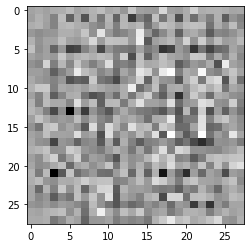

In [ ]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])  #noise를 어떻게 주냐에 따라 결과가 달라짐
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

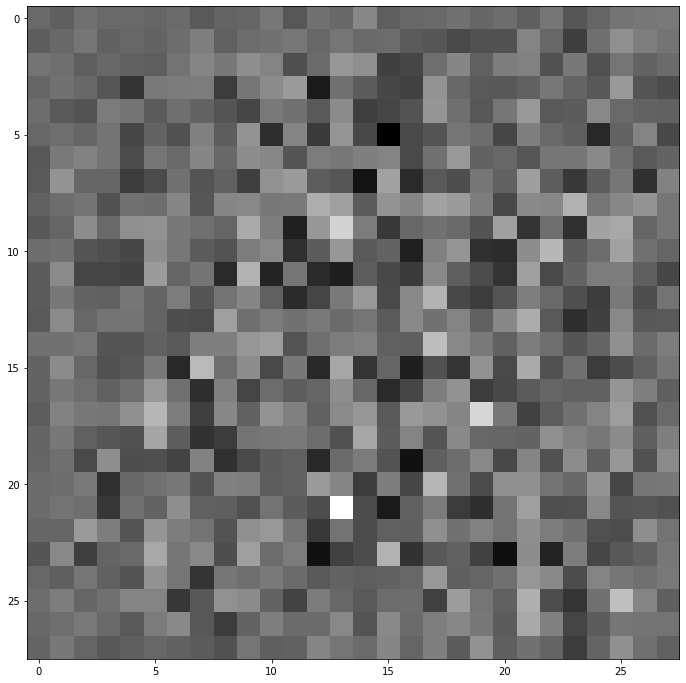

In [ ]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])  #noise를 어떻게 주냐에 따라 결과가 달라짐
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

In [ ]:
# def make_discriminator_model():
#     model = tf.keras.Sequential()
#     model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
#                                      input_shape=[28, 28, 1]))
#     model.add(layers.LeakyReLU())
#     model.add(layers.Dropout(0.3))

#     model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
#     model.add(layers.LeakyReLU())
#     model.add(layers.Dropout(0.3))

#     model.add(layers.Flatten())
#     model.add(layers.Dense(1))

#     return model

In [ ]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

# 이 메서드는 크로스 엔트로피 손실함수 (cross entropy loss)를 계산하기 위해 헬퍼 (helper) 함수를 반환합니다.
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

tf.Tensor([[8.640758e-05]], shape=(1, 1), dtype=float32)


In [ ]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

# 이 메서드는 크로스 엔트로피 손실함수 (cross entropy loss)를 계산하기 위해 헬퍼 (helper) 함수를 반환합니다.
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

tf.Tensor([[-0.00173743]], shape=(1, 1), dtype=float32)


우선은 교안을 따라서 두 번의 시도를 해봤는데,,, noise가 random하게 들어가기 때문에 값이 다름(noise의 범위는 DCGAN 논문에서도 동일하게 설정했던 것 같은데,,,다시 읽어봐야 할 것 같음)

In [ ]:
# def discriminator_loss(real_output, fake_output):
#     real_loss = cross_entropy(tf.ones_like(real_output), real_output)
#     fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
#     total_loss = real_loss + fake_loss
#     return total_loss

In [ ]:
# def generator_loss(fake_output):
#     return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# learning_rate ; 1e-4=1/1000, 0.01~0.000001정도

# 딥러닝에서는 체크포인트가 일반적
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# 이 시드를 시간이 지나도 재활용하겠습니다. 
# (GIF 애니메이션에서 진전 내용을 시각화하는데 쉽기 때문입니다.) 
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=(1e-5)*2, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=(1e-5)*2, beta_1=0.5)

윗 부분은 동일하게 따라가고, 두 번째 시도의 optimizer만 DCGAN을 따라서 설정해봄

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=(1e-5)*2)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=(1e-5)*2)

# learning_rate ; 1e-4=1/1000, 0.01~0.000001정도

# 딥러닝에서는 체크포인트가 일반적
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# 이 시드를 시간이 지나도 재활용하겠습니다. 
# (GIF 애니메이션에서 진전 내용을 시각화하는데 쉽기 때문입니다.) 
seed = tf.random.normal([num_examples_to_generate, noise_dim])

하기의 과정에서 에러를 겪고, beta_1만 다시 default를 따르게끔 재선언

In [ ]:
# # `tf.function`이 어떻게 사용되는지 주목해 주세요.
# # 이 데코레이터는 함수를 "컴파일"합니다.
# @tf.function
# def train_step(images):
#     noise = tf.random.normal([BATCH_SIZE, noise_dim])

#     with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
#       generated_images = generator(noise, training=True)

#       real_output = discriminator(images, training=True)
#       fake_output = discriminator(generated_images, training=True)

#       gen_loss = generator_loss(fake_output)
#       disc_loss = discriminator_loss(real_output, fake_output)

#     gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
#     gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

#     generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
#     discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [ ]:
# def train(dataset, epochs):
#   for epoch in range(epochs):
#     start = time.time()

#     for image_batch in dataset:
#       train_step(image_batch)

#     # GIF를 위한 이미지를 바로 생성합니다.
#     display.clear_output(wait=True)
#     generate_and_save_images(generator,
#                              epoch + 1,
#                              seed)

#     # 15 에포크가 지날 때마다 모델을 저장합니다.
#     if (epoch + 1) % 15 == 0:
#       checkpoint.save(file_prefix = checkpoint_prefix)

#     # print (' 에포크 {} 에서 걸린 시간은 {} 초 입니다'.format(epoch +1, time.time()-start))
#     print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

#   # 마지막 에포크가 끝난 후 생성합니다.
#   display.clear_output(wait=True)
#   generate_and_save_images(generator,
#                            epochs,
#                            seed)

In [ ]:
# def generate_and_save_images(model, epoch, test_input):
#   # `training`이 False로 맞춰진 것을 주목하세요.
#   # 이렇게 하면 (배치정규화를 포함하여) 모든 층들이 추론 모드로 실행됩니다. 
#   predictions = model(test_input, training=False)

#   fig = plt.figure(figsize=(4,4))

#   for i in range(predictions.shape[0]):
#       plt.subplot(4, 4, i+1)
#       plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
#       plt.axis('off')

#   plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
#   plt.show()

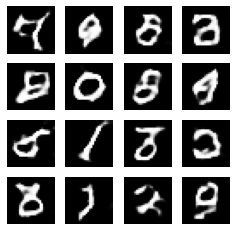

CPU times: user 2min 36s, sys: 13.2 s, total: 2min 50s
Wall time: 5min 29s


In [ ]:
%%time
train(train_dataset, EPOCHS)

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [ ]:
# %%time
train(train_dataset, EPOCHS)

TypeError: ignored

beta_1을 기본값을 따르도록, 재선언했음에도 교안을 따른 두 번째 시도에서는 error를 겪음

In [ ]:
# 에포크 숫자를 사용하여 하나의 이미지를 보여줍니다.
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

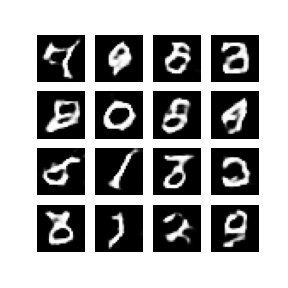

In [ ]:
display_image(EPOCHS)

첫 번째 시도에서는 증강한 데이터로도 식별가능한 범위의 이미지를 생성했음

CTGAN? semi-supervised data ~~?? 정확하게 어떤 논문이었는지는 기억이 나지 않지만, 이렇게 증강한 데이터를 다시 $input_a$로 두고, 증강 과정을 반복하는 내용에 대한 부분도 GAN에 관심을 가지게 된 계기임(문제점 : overfitting)

하지만 두 번째 시도에서 막히고, 세 번째 시도는 하지도 못하고 우선 시험일이 되었음

이론과 적용은 다르단 것을 깨닫고, 변수 내 입력값을 함수를 사용할 때마다 적용하기 위해서는 잘 짜인 함수도 이해한 뒤 본인의 방식에 맞춰야 함을 절실하게 깨달음

근데,,,모르는 게 너무 많고, 알아야 할 것들도 너무 많은 게 문제임

In [ ]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    frame = 2*(i**0.5)
    if round(frame) > round(last):
      last = frame
    else:
      continue
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

import IPython
if IPython.version_info > (6,2,0,''):
  display.Image(filename=anim_file)

In [ ]:
try:
  from google.colab import files
except ImportError:
  pass
else:
  files.download(anim_file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>